# Машинное обучение в задачах сжатия информации
---

## Идея курсовой работы и бизнес-задача

Сжатие информации является критически важной задачей в современных информационных технологиях, особенно учитывая постоянно растущий объем данных. Это особенно актуально для изображений, которые занимают значительную часть интернет-трафика и хранилищ данных. Машинное обучение, и, в частности, методы, основанные на глубоком обучении, представляют значительный интерес в связи с их способностью эффективно обрабатывать большие массивы данных и выделять сложные паттерны и зависимости.


В данной работе будет рассмотрено применение как традиционных методов машинного обучения, включая метод главных компонент (PCA), который является одним из классических подходов в этой области, и техники использования многослойных перцептронов (MLP) с Фурье-признаками. Сравним эффективность этих методов в контексте сжатия изображений и проанализируем их преимущества и недостатки с помощью различных метрик качества.

Бизнес-задача: разработка методов сжатия изображений для оптимизации хранения, отображения и передачи данных.


## Импорт основных библиотек

In [1]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm.notebook import tqdm  
import warnings
import cv2
import imageio
import time
import os


warnings.filterwarnings('ignore')
sns.set_theme(style='whitegrid')

## Анализ и обработка датасета

### Описание датасета 
Для нашего исследования был выбран датасет ["Super Resolution"](https://www.kaggle.com/datasets/sapal6/superresolution), доступный на платформе Kaggle. Датасет содержит изображения в разделенные на разные директории. Каждая директория названа по типу изображения, которое она содержит. Основное его преимущество — хорошо структурированный набор данных с ясными метками разрешения, что позволяет непосредственно сравнивать производительность различных методов обработки.

**Структура датасета:**

In [2]:
dataset_directory = '/kaggle/input/superresolution'

for folder_name in os.listdir(dataset_directory):
    folder_path = os.path.join(dataset_directory, folder_name)
    if os.path.isdir(folder_path):  # Проверяем, что это папка
        num_images = len([name for name in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, name))])
        print(f"Директория: {folder_name}, количество изображений: {num_images}")

Директория: dance, количество изображений: 2000
Директория: fireworks, количество изображений: 1223
Директория: sports, количество изображений: 227
Директория: wildlife, количество изображений: 345
Директория: dogs-running, количество изображений: 743
Директория: busystreet, количество изображений: 2507
Директория: nature, количество изображений: 1999
Директория: kids-playing, количество изображений: 1114
Директория: dogs, количество изображений: 645
Директория: underwater, количество изображений: 2587
Директория: trains, количество изображений: 80


Пример одного из изображений в полном размере:

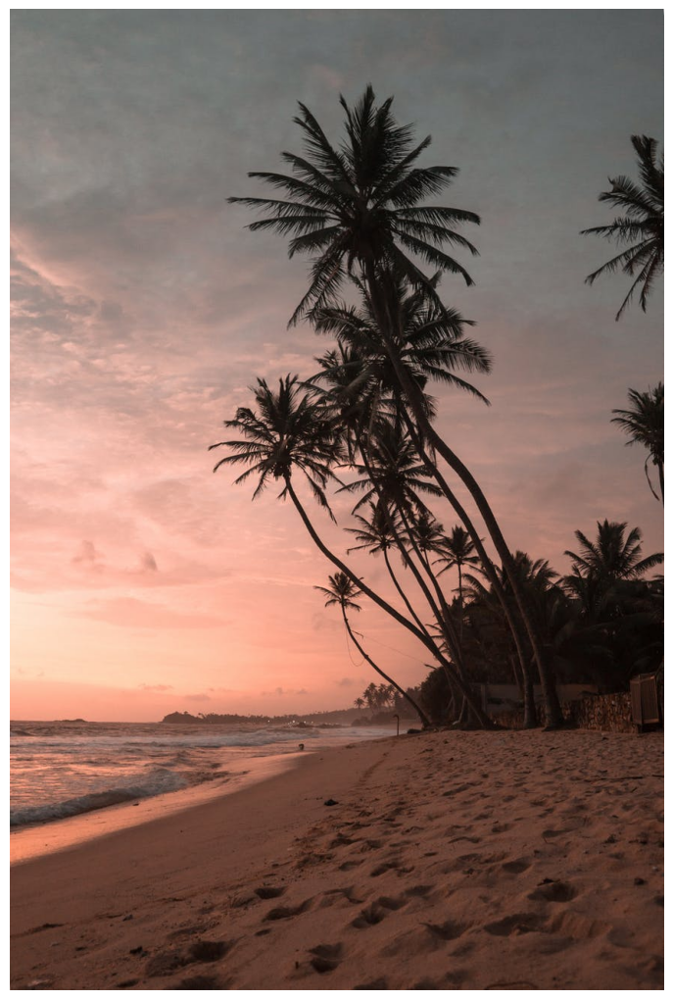

In [3]:
image_path = '/kaggle/input/superresolution/nature/0014.jpg'
image = mpimg.imread(image_path)

# Создаем фигуру с размерами, адаптированными к размерам изображения
plt.figure(figsize=(image.shape[1] / 100, image.shape[0] / 100))  # размеры в дюймах

# Отображаем изображение
plt.imshow(image)
plt.axis('off')
plt.show()

Для улучшения анализа и удобства визуализации в дальнейшем исследовании будет использоваться квадратный фрагмент, вырезанный из центра каждого изображения. 

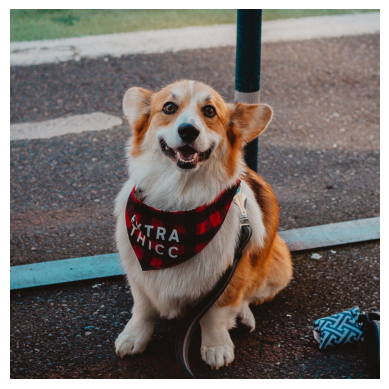

In [4]:
img = imageio.imread('/kaggle/input/superresolution/dogs/0069.jpg')[..., :3] / 255.0
crop_size = 512
center_x, center_y = img.shape[0] // 2, img.shape[1] // 2
img_cropped = img[center_x-crop_size:center_x+crop_size, center_y-crop_size:center_y+crop_size]


plt.imshow(img_cropped)
plt.axis('off') 
plt.show()

### Предобработка 
Сделаем такой же центральный вырез с остальными изображениями в директории и преобразуем их в вектор признаков для подготовки данных к обучению PCA

Как работает `.flatten()`: \
При вызове `.flatten()` на массиве, NumPy "выпрямляет" или "сглаживает" массив, раскладывая его элементы в одну строку по порядку.
 Метод создаёт копию данных, а не представление. Это значит, что изменения в полученном одномерном массиве не повлияют на исходный многомерный массив.


In [5]:
def preprocess_image(image_path, crop_size=512):
    img = imageio.imread(image_path)
    img = img / 255.0  # Нормализация данных
    center_x, center_y = img.shape[0] // 2, img.shape[1] // 2
    img_cropped = img[center_x-crop_size//2:center_x+crop_size//2,
                      center_y-crop_size//2:center_y+crop_size//2]
    return img_cropped.flatten()  # Возвращаем вектор признаков

directory_path = '/kaggle/input/superresolution/dogs'
crop_size = 512  # Обновленный размер выреза

# Создаем memmap файл
n_images = len([name for name in os.listdir(directory_path) if name.endswith('.jpg')])
vector_length = crop_size * crop_size * 3  # Для цветных изображений
filename_memmap = 'data.memmap'
mmap = np.memmap(filename_memmap, dtype='float32', mode='w+', shape=(n_images, vector_length))

# Замер времени перед началом обработки
start_time = time.time()

# Загрузка и сохранение изображений в memmap с прогресс-баром
sorted_filenames = sorted([name for name in os.listdir(directory_path) if name.endswith('.jpg')])
for i, filename in tqdm(enumerate(sorted_filenames), total=n_images, desc="Обработка изображений"):
    image_path = os.path.join(directory_path, filename)
    mmap[i] = preprocess_image(image_path)

mmap.flush()

# Замер времени после завершения обработки и вывод времени выполнения
end_time = time.time()
print(f"Прошло времени: {end_time - start_time:.2f} секунд")


Обработка изображений:   0%|          | 0/645 [00:00<?, ?it/s]

Прошло времени: 34.09 секунд


Пример обработанного изображения:

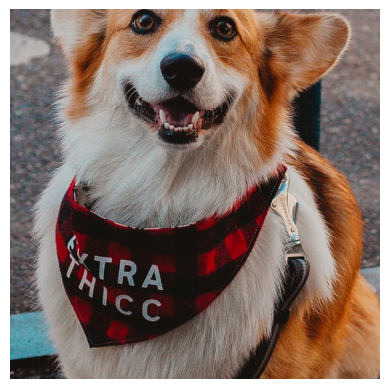

In [6]:
# Создание memmap-файла для чтения
mmap = np.memmap(filename_memmap, dtype='float32', mode='r', shape=(n_images, vector_length))

# Индекс изображения для отображения
image_index = 68 

# Изменение формы данных изображения обратно к исходной форме 
image_shape = (crop_size, crop_size, 3)  # Форма должна соответствовать исходным размерам изображения
image_data = mmap[image_index].reshape(image_shape)

# Отображение изображения
plt.imshow(image_data)
plt.axis('off')  
plt.show()


## Построение модели PCA

### Описание работы алгоритма PCA и его использование в задаче

**Метод главных компонент (PCA)** — это статистический метод, используемый для уменьшения размерности данных путём преобразования исходного набора переменных в новый набор некоррелированных переменных. Эти новые переменные называются главными компонентами. PCA ищет направления, в которых данные имеют наибольшую дисперсию, что позволяет сократить количество переменных, сохраняя при этом максимальное количество информации.

**Как работает PCA**:
1. **Центрирование данных**: из каждой переменной (например, значения пикселя) вычитается среднее, чтобы данные были сосредоточены вокруг начала координат.
2. **Вычисление ковариационной матрицы**: Она показывает, как переменные связаны друг с другом.
3. **Нахождение собственных значений и собственных векторов ковариационной матрицы**: собственные векторы указывают направления максимальной дисперсии, а собственные значения дают величину дисперсии в этих направлениях.
4. **Сортировка собственных значений и соответствующих собственных векторов**: Самые большие собственные значения и их соответствующие собственные векторы являются первыми главными компонентами.
5. **Проекция данных на главные компоненты**: Данные проецируются на выбранные главные компоненты для уменьшения размерности.

**Выбор PCA для исследовательской работы**:
1. **Эффективность**: PCA позволяет выделить наиболее значимые признаки из большого набора данных, что улучшает эффективность анализа и обработки.
2. **Уменьшение шума**: Удаление малозначимых компонентов может помочь уменьшить шум в данных.


Выбор PCA для данной задачи обусловлен желанием эффективно уменьшить размер данных и одновременно сохранить как можно больше информативных признаков. \
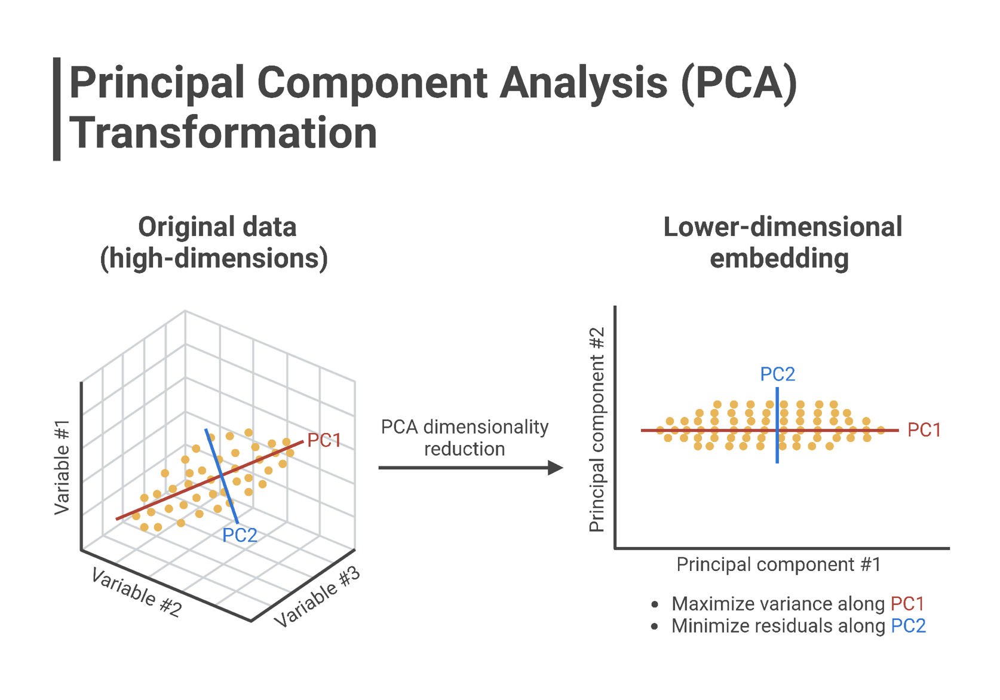

Так же стоит отметить, что: \
Метод главных компонент (PCA) по своей сути является методом уменьшения размерности, а не предсказательной моделью, из-за чего он не требует использования кросс-валидации или других метрик качества (кроме объясняющей дисперсии в некоторых ситуациях), которые обычно применяются для оценки моделей машинного обучения.


Существует готовая реализация PCA в библиотеке `scikit-learn`
```python
from sklearn.decomposition import PCA
```
Однако, в рамках данной работы (и бизнес задачи в том числе) корректнее будет самостоятельно реализовать данный алгоритм, чтобы показать простоту инициализации и применения в сравнении с дркгими методами. 

PCA можно реализовать в PyTorch через сингулярное разложение (SVD), которое лежит в основе PCA. Это дает возможность использовать мощности GPU для ускорения вычислений, особенно при работе с большими данными.

В коде используется функция `torch.svd()` для выполнения SVD, которая разлагает матрицу данных на три компоненты $U$, $S$ и $V.V$ содержит собственные векторы данных, и проецирование данных на первые `n` столбцов $V$ (соответствующих наибольшим собственным значениям в $S$ даёт результаты, аналогичные PCA.

**Ключевые аспекты реализации PCA в PyTorch:**
- **Центрирование данных**: Перед применением SVD необходимо вычесть среднее каждого признака из данных для центрирования. Это обеспечивает корректное нахождение направлений максимальной вариативности.
- **Применение SVD**: `torch.svd()` применяется для вычисления сингулярного разложения центрированных данных.
- **Проекция на компоненты**: Данные проецируются на первые `n` компонентов $V$, что и является сутью PCA — снижение размерности с сохранением максимальной дисперсии.


In [7]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error as mse

In [11]:
def svd_flip(u, v):
    # Переворачиваем знаки сингулярных векторов для стабильности знаков между SVD вычислениями
    max_abs_cols = torch.argmax(torch.abs(u), 0)  # Ищем максимальные по модулю значения в каждом столбце u
    signs = torch.sign(u[max_abs_cols, torch.arange(u.shape[1]).to(u.device)])  # Знаки максимальных элементов
    u *= signs  # Корректируем знаки u
    v *= signs.view(-1, 1)  # Корректируем знаки v
    return u, v

class PCA(nn.Module):
    def __init__(self, n_components):
        super().__init__()
        self.n_components = n_components  # Число компонент для сокращения размерности

    @torch.no_grad()  
    def fit(self, X):
        n, d = X.size()
        if self.n_components is not None:
            d = min(self.n_components, d)  # Определяем число компонент как минимум из желаемого и возможного
        self.register_buffer("mean_", X.mean(0, keepdim=True))  # Среднее значение для центрирования данных
        Z = X - self.mean_  # Центрирование данных
        U, S, Vh = torch.linalg.svd(Z, full_matrices=False)  # Вычисление сингулярного разложения
        U, Vt = svd_flip(U, Vh)  # Коррекция знаков сингулярных векторов
        self.register_buffer("components_", Vt[:d])  # Сохранение компонент в буфер
        return self

    def forward(self, X):
        return self.transform(X)

    def transform(self, X):
        assert hasattr(self, "components_"), "Необходимо выполнить метод fit перед использованием."
        return torch.matmul(X - self.mean_, self.components_.t())  # Проекция данных на главные компоненты

    def fit_transform(self, X):
        self.fit(X)
        return self.transform(X)

    def inverse_transform(self, Y):
        assert hasattr(self, "components_"), "Необходимо выполнить метод fit перед использованием."
        return torch.matmul(Y, self.components_) + self.mean_  # Восстановление данных из сокращенного пространства


### Обучение PCA на всем массиве данных:

In [9]:
# Загрузка данных и инициализация PCA
data = torch.tensor(mmap).float().cuda()
pca = PCA(n_components=data.shape[1])
pca.fit(data)  # Обучение PCA на всех данных

# Расчёт диапазона компонентов для визуализации и анализа
components_range = range(5, 645, 25)

# Инициализация индикатора прогресса taqdm
start_time = time.time()
pbar = tqdm(total=len(components_range), desc='Прогресс PCA')

# Итерация по диапазону компонентов
for n_components in components_range:
    # Трансформация данных с использованием текущего числа компонентов
    pca.n_components = n_components
    pca_results = pca.transform(data)
    
    # Расчёт объяснённой дисперсии
    total_variance = pca.components_.pow(2).sum()
    explained_variance = pca.components_[:n_components].pow(2).sum() / total_variance * 100

    # Вывод результатов перед обновлением прогресс бара
    print(f'Количество компонент: {n_components}\nОбъяснённая дисперсия: {explained_variance:.2f}%')
    print('-------------------------')

    # Обновление индикатора прогресса
    pbar.update(1)

# Завершение работы индикатора прогресса и таймера
pbar.close()
end_time = time.time()
print(f"Прошло времени: {end_time - start_time:.2f} секунд")

Прогресс PCA:   0%|          | 0/26 [00:00<?, ?it/s]

Количество компонент: 5
Объяснённая дисперсия: 0.78%
-------------------------
Количество компонент: 30
Объяснённая дисперсия: 4.65%
-------------------------
Количество компонент: 55
Объяснённая дисперсия: 8.53%
-------------------------
Количество компонент: 80
Объяснённая дисперсия: 12.40%
-------------------------
Количество компонент: 105
Объяснённая дисперсия: 16.28%
-------------------------
Количество компонент: 130
Объяснённая дисперсия: 20.15%
-------------------------
Количество компонент: 155
Объяснённая дисперсия: 24.03%
-------------------------
Количество компонент: 180
Объяснённая дисперсия: 27.91%
-------------------------
Количество компонент: 205
Объяснённая дисперсия: 31.78%
-------------------------
Количество компонент: 230
Объяснённая дисперсия: 35.66%
-------------------------
Количество компонент: 255
Объяснённая дисперсия: 39.53%
-------------------------
Количество компонент: 280
Объяснённая дисперсия: 43.41%
-------------------------
Количество компонент: 30

### Вывод и анализ результатов

Для наглядности выведем пример восстановленного изображения с разным числом компонент

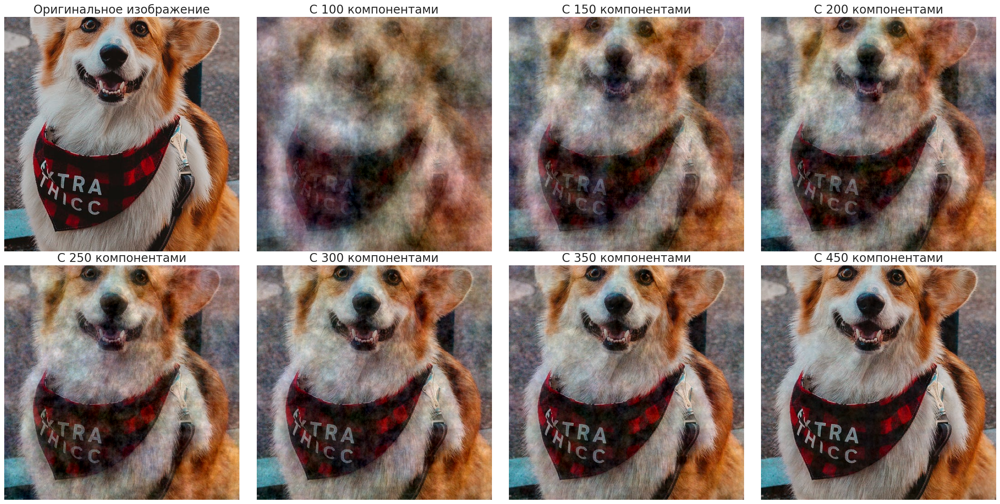

In [12]:
pca = PCA(n_components=645) 

components_to_visualize = [100, 150, 200, 250, 300, 350, 450]
images = []

# Оригинальное изображение для сравнения
original_image = data[68].cpu().numpy().reshape(512, 512, 3)
images.append(('Оригинальное изображение', original_image))

# Проведение PCA и восстановление изображений для каждого количества компонент
for k in components_to_visualize:
    pca.n_components = k
    pca.fit(data)  # Обучаем модель на данных
    reconstructed_data = pca.inverse_transform(pca.transform(data[68].unsqueeze(0)))
    image_reconstructed = reconstructed_data.squeeze(0).cpu().numpy().reshape(512, 512, 3)
    images.append((f'С {k} компонентами', image_reconstructed))


# Визуализация изображений
fig, axes = plt.subplots(2, 4, figsize=(24, 12))
for ax, (title, img) in zip(axes.flatten(), images):
    ax.imshow((np.clip(img, 0, 1) * 255).astype(np.uint8))
    ax.set_title(title, fontsize=20)
    ax.axis('off')
plt.tight_layout()
plt.show()


На представленных изображениях видно, как работает алгоритм PCA с разным количеством компонент. При увеличении числа компонент качество восстановленного изображения улучшается, так как алгоритм может сохранять больше информации о структуре исходных данных. На изображении с 5 компонентами детали практически неразличимы, по мере увеличения количества компонентов (например, в данном примере с 250) изображение становится всё более чётким.

Для более точного анализа степени и качества сжатия были выбраны следующие метрики: 
- ***Степень сжатия (Compression Ratio):*** Это отношение исходного размера изображения к размеру сжатого изображения. Чем выше это значение, тем больше степень сжатия. \
$\text{Степень сжатия} = \frac{\text{Размер исходного изображения}}{\text{Размер сжатого изображения}}$
- ***PSNR (Peak Signal to Noise Ratio):*** Это мера, которая показывает отношение максимально возможной мощности сигнала к мощности искажающего шума. PSNR используется для оценки качества восстановленного изображения по сравнению с оригиналом. Высокий PSNR обычно означает меньшее визуальное искажение.
 $PSNR = 20 \cdot \log_{10} \left(\frac{MAX_I}{\sqrt{MSE}}\right)$\
где $MAX_I$ — максимальное возможное значение пикселя изображения. Эти метрики помогают оценить, насколько хорошо сеть восстанавливает детали и текстуры изображения.
- ***MSE (Mean Squared Error):*** Среднеквадратичное отклонение между исходным и сжатым изображением. Низкие значения MSE указывают на меньшее количество ошибок при сжатии.
- ***Bitrate:*** Эта метрика указывает на количество битов, используемых для хранения одного пикселя изображения. Меньший bitrate обычно указывает на более высокую степень сжатия.




In [13]:
# Создадим df со значениями метрик и выведем первых 15 строк из него
metrics = []
all_components = range(5, 645, 20)  # Компоненты для метрик

for k in all_components:
    pca = PCA(n_components=k).fit(data)  # Пересоздаём PCA с новым количеством компонент
    reconstructed_data = pca.inverse_transform(pca.transform(data[68].unsqueeze(0)))
    image_reconstructed = reconstructed_data.squeeze(0).cpu().numpy().reshape(512, 512, 3)
    
    # Расчет метрик
    cr = (512**2 * 3) / (k * 512 * 3)  # Compression Ratio3
    psnr_value = psnr(original_image, image_reconstructed, data_range=1)
    bitrate = (k * 512 * 3) / 512
    mse_value = mse(original_image, image_reconstructed)
    metrics.append((k, cr, psnr_value, mse_value, bitrate))

metrics_df = pd.DataFrame(metrics, columns=['Компоненты', 'Compression Ratio', 'PSNR', 'MSE', 'Bitrate'])
metrics_df.head(15) 


,Компоненты,Compression Ratio,PSNR,MSE,Bitrate
0,5,102.400000,13.918992,0.040560,15.0
1,25,20.480000,14.610330,0.034591,75.0
2,45,11.377778,15.894512,0.025736,135.0
3,65,7.876923,16.566715,0.022046,195.0
4,85,6.023529,17.322873,0.018523,255.0
5,105,4.876190,18.249726,0.014963,315.0
6,125,4.096000,19.190987,0.012048,375.0
7,145,3.531034,20.316211,0.009298,435.0
8,165,3.103030,20.758221,0.008398,495.0
9,185,2.767568,21.600559,0.006917,555.0


In [14]:
torch.cuda.empty_cache()
torch.cuda.memory.reset_accumulated_memory_stats()

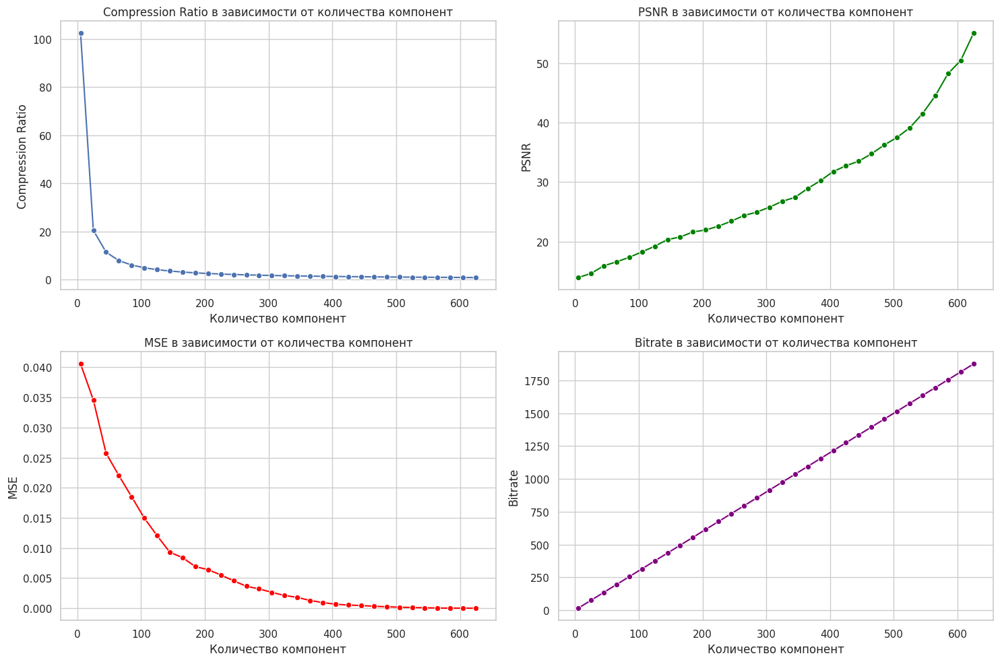

In [15]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10)) 

# Compression Ratio
sns.lineplot(ax=axes[0, 0], data=metrics_df, x='Компоненты', y='Compression Ratio', marker='o')
axes[0, 0].set_title('Compression Ratio в зависимости от количества компонент')
axes[0, 0].set_xlabel('Количество компонент')
axes[0, 0].set_ylabel('Compression Ratio')

# PSNR
sns.lineplot(ax=axes[0, 1], data=metrics_df, x='Компоненты', y='PSNR', marker='o', color='green')
axes[0, 1].set_title('PSNR в зависимости от количества компонент')
axes[0, 1].set_xlabel('Количество компонент')
axes[0, 1].set_ylabel('PSNR')

# MSE
sns.lineplot(ax=axes[1, 0], data=metrics_df, x='Компоненты', y='MSE', marker='o', color='red')
axes[1, 0].set_title('MSE в зависимости от количества компонент')
axes[1, 0].set_xlabel('Количество компонент')
axes[1, 0].set_ylabel('MSE')

# Bitrate
sns.lineplot(ax=axes[1, 1], data=metrics_df, x='Компоненты', y='Bitrate', marker='o', color='purple')
axes[1, 1].set_title('Bitrate в зависимости от количества компонент')
axes[1, 1].set_xlabel('Количество компонент')
axes[1, 1].set_ylabel('Bitrate')

# Настройка отображения графиков
plt.tight_layout()
plt.show()


### Промежуточные выводы по PCA:
**Основные плюсы для бизнес-задачи:**
- PCA эффективно уменьшает размерность данных, сохраняя при этом наиболее значимые черты, что ускоряет обработку и анализ больших объемов данных.
- Простота и низкая вычислительная сложность сравнительно с глубоким обучением упрощают интеграцию в системы с ограниченными ресурсами.

**Минусы в сравнении с другими алгоритмами:**
- Неспособность адекватно обрабатывать нелинейные зависимости и высокую вариативность данных, что может быть критично для сложных бизнес-задач.
- Чувствительность к шуму и выбросам, что делает PCA менее надежным при наличии искажений в исходных данных.
- Есть явные пределы в возможностях оптимизации  и масштабирования

## Построение модели Fourier Feature Network

### Сети с Фурье-признаками

В последнее время в области компьютерного зрения и графики наблюдается тенденция замены традиционных дискретных представлений объектов и сцен (таких как меш-сетки и воксельные решетки) на непрерывные функции, параметризованные с помощью глубоких полносвязных сетей, известных как многослойные перцептроны (MLP). Эти сети принимают на вход низкоразмерные координаты и обучаются предсказывать характеристики формы, плотности или цвета в каждой точке входных данных.

#### Принцип работы:

Сеть с Фурье-признаками для сжатия изображений основана на глубоком обучении с использованием специализированного встраивания данных в пространство, что облегчает обучение высокочастотным характеристикам. Ниже представлены основные этапы её работы:

1. **Фурье-признаковое преобразование**:
    Входные данные (координаты пикселей) преобразуются с помощью следующего преобразования:
    $$
    \gamma(\mathbf{x}) = (\cos(2 \pi \mathbf{B} \mathbf{x}), \sin(2 \pi \mathbf{B} \mathbf{x}))
    $$
    где $\mathbf{B}$ — матрица с обучаемыми параметрами. Это преобразование позволяет эффективно кодировать информацию о местоположении для последующей обработки.

2. **Многослойный перцептрон (MLP)**:
    Преобразованные данные подаются на вход многослойного перцептрона, который состоит из нескольких слоёв с активационной функцией ReLU и завершающего слоя с активацией Sigmoid:
    $$
    MLP(\gamma(\mathbf{x})) = \sigma(\mathbf{W}_n \dots \sigma(\mathbf{W}_1 \gamma(\mathbf{x}) + \mathbf{b}_1) \dots + \mathbf{b}_n)
    $$
    где $\mathbf{W}_i$ и $\mathbf{b}_i$ — параметры слоёв, $\sigma$ — сигмоидная функция.

3. **Оптимизация и функция потерь**:
    Модель обучается путём минимизации функции потерь, которая чаще всего является среднеквадратичной ошибкой между исходным и восстановленным изображением:
    $$
    L(\theta) = \frac{1}{N} \sum_{i=1}^N (\mathbf{y}_i - MLP(\gamma(\mathbf{x}_i;\mathbf{B});\theta))^2
    $$
    где $\theta$ обозначает совокупность всех обучаемых параметров сети, $N$ — количество обучающих примеров, $\mathbf{y}_i$ — исходные данные изображения.

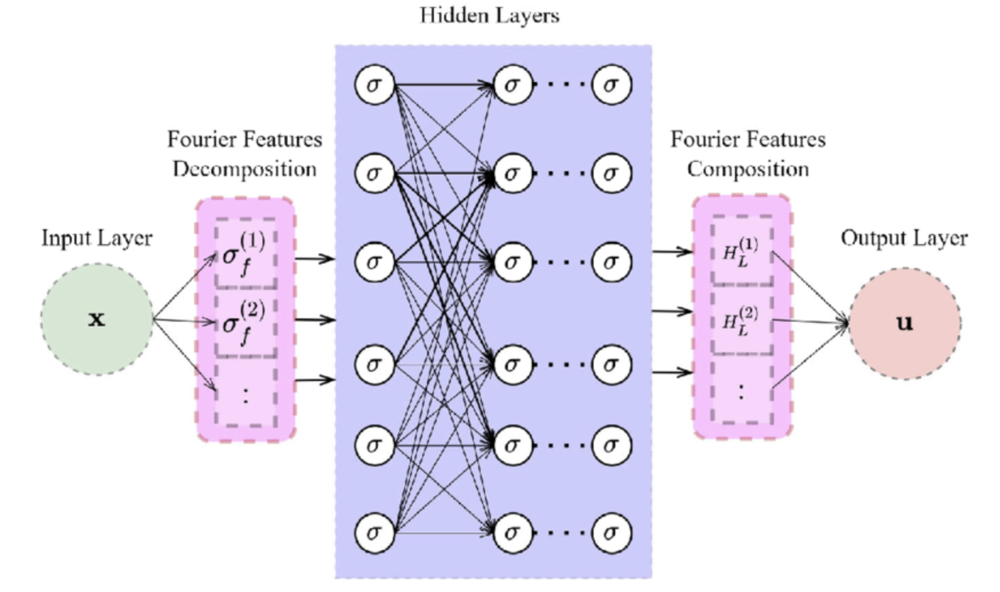

#### Выбор метода для исследования:

- **Улучшение производительности**: Преобразование Фурье-признаков значительно улучшает способность MLP к обучению высокочастотным функциям, что критически важно для точного представления детализированных 3D-объектов и сложных сцен.
- **Гибкость и настройка**: Предложенный метод позволяет гибко настраивать параметры преобразования в зависимости от конкретной задачи, обеспечивая оптимальное сочетание точности и скорости обучения.



In [16]:
import jax.numpy as np
from jax import random, jit, grad, device_put
from jax.example_libraries import stax, optimizers


rand_key = random.PRNGKey(42)

### Пердобработка данных и обучение модели

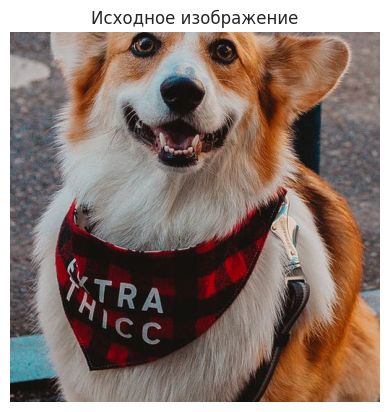

In [17]:
image_path = '/kaggle/input/superresolution/dogs/0069.jpg'
img = imageio.imread(image_path)[..., :3] / 255.
c = [img.shape[0]//2, img.shape[1]//2]
r = 256
img = img[c[0]-r:c[0]+r, c[1]-r:c[1]+r]

plt.imshow(img)
plt.title('Исходное изображение')
plt.axis('off')
plt.show()

# Создание входных пиксельных координат в единичном квадрате
coords = np.linspace(0, 1, img.shape[1], endpoint=False)
x_test = np.stack(np.meshgrid(coords, coords), -1)
test_data = [x_test, img]
train_data = [x_test[::2, ::2], img[::2, ::2]]


**Реализация сети с Фурье-признаками** 

In [18]:
# Фурье-преобразование признаков
def input_mapping(x, B):
    # Если B равно None, используем исходный вектор x без преобразований
    if B is None:
        return x
    else:
        # Применяем Фурье-преобразование к входным данным
        x_proj = (2.*np.pi*x) @ B.T
        return np.concatenate([np.sin(x_proj), np.cos(x_proj)], axis=-1)

# Определение сети JAX
def make_network(num_layers, num_channels):
    # Создание многослойной нейронной сети
    layers = []
    for i in range(num_layers - 1):
        layers.append(stax.Dense(num_channels))
        layers.append(stax.Relu)
    layers.append(stax.Dense(3))
    layers.append(stax.Sigmoid)
    return stax.serial(*layers)

# Обучение модели
def train_model(network_size, learning_rate, iters, B, train_data, test_data):
    # Инициализация и определение функции сети
    init_fn, apply_fn = make_network(*network_size)

    # Компилируем функцию модели для предсказания
    model_pred = jit(lambda params, x: apply_fn(params, input_mapping(x, B)))
    # Компилируем функцию потерь
    model_loss = jit(lambda params, x, y: 0.5 * np.mean((model_pred(params, x) - y) ** 2))
    # Компилируем функцию вычисления PSNR
    model_psnr = jit(lambda params, x, y: -10 * np.log10(2.*model_loss(params, x, y)))
    # Компилируем функцию вычисления градиента потерь
    model_grad_loss = jit(lambda params, x, y: grad(model_loss)(params, x, y))

    # Инициализация оптимизатора
    opt_init, opt_update, get_params = optimizers.adam(learning_rate)
    opt_update = jit(opt_update)

    # Инициализация параметров
    _, params = init_fn(rand_key, (-1, input_mapping(train_data[0], B).shape[-1]))
    opt_state = opt_init(params)

    train_losses = []
    train_psnrs = []
    test_losses = []
    test_psnrs = []
    pred_imgs = []
    xs = []

    # Цикл обучения
    for i in tqdm(range(iters), desc='train iter', leave=False):
        opt_state = opt_update(i, model_grad_loss(get_params(opt_state), *train_data), opt_state)

        # Сохранение результатов каждые 25 итераций
        if i % 25 == 0:
            current_params = get_params(opt_state)
            train_psnrs.append(model_psnr(current_params, *train_data))
            train_losses.append(model_loss(current_params, *train_data))
            test_losses.append(model_loss(current_params, *test_data))
            test_psnrs.append(model_psnr(current_params, *test_data))
            pred_imgs.append(model_pred(current_params, test_data[0]))
            xs.append(i)

    return {
        'state': current_params,
        'train_losses': train_losses,
        'train_psnrs': train_psnrs,
        'test_losses': test_losses,
        'test_psnrs': test_psnrs,
        'pred_imgs': np.stack(pred_imgs),
        'xs': xs,
    }

**Инициализация обучения**

In [19]:
# Инициализация параметров сети
network_size = (4, 256)
learning_rate = 1e-4
iters = 2000

# Размерность пространства признаков
mapping_size = 256

# Инициализация различных типов преобразования Фурье
B_dict = {}
B_dict['none'] = None  # Стандартная сеть без преобразования
B_dict['basic'] = np.eye(2)  # Базовое преобразование

# Генерация гауссовских преобразований с различными масштабами
rand_key = random.PRNGKey(0)
B_gauss = random.normal(rand_key, (mapping_size, 2))
for scale in [1, 10, 100]:
    B_dict[f'gauss_{scale}'] = B_gauss * scale

outputs = {}  # Словарь для хранения результатов
start_time = time.time()
# Обучение модели для каждого типа преобразования
for k in tqdm(B_dict.keys(), desc='Training models'):
    start_time = time.time() 
    outputs[k] = train_model(network_size, learning_rate, iters, B_dict[k], train_data, test_data)

end_time = time.time()
print(f"Прошло времени: {end_time - start_time:.2f} секунд")

Training models:   0%|          | 0/5 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

Прошло времени: 37.12 секунд


### Вывод и анализ результатов

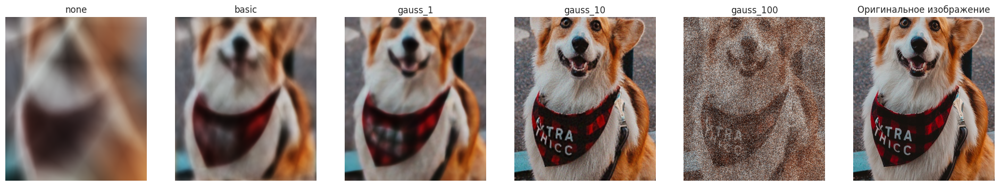

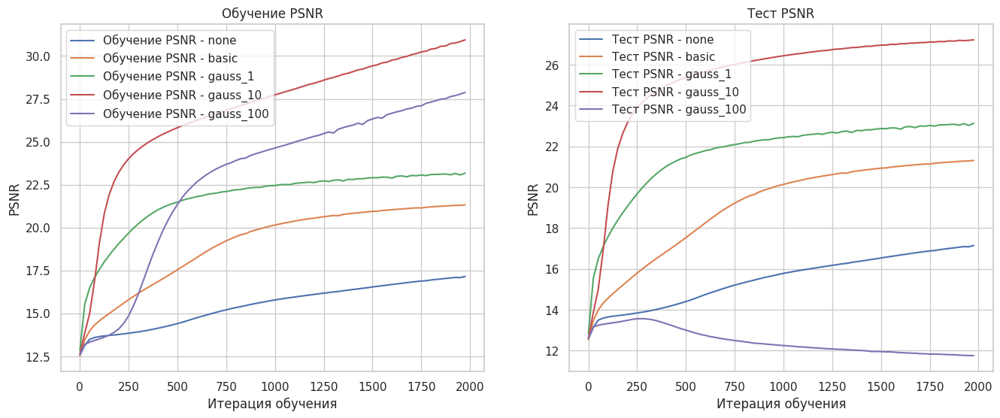

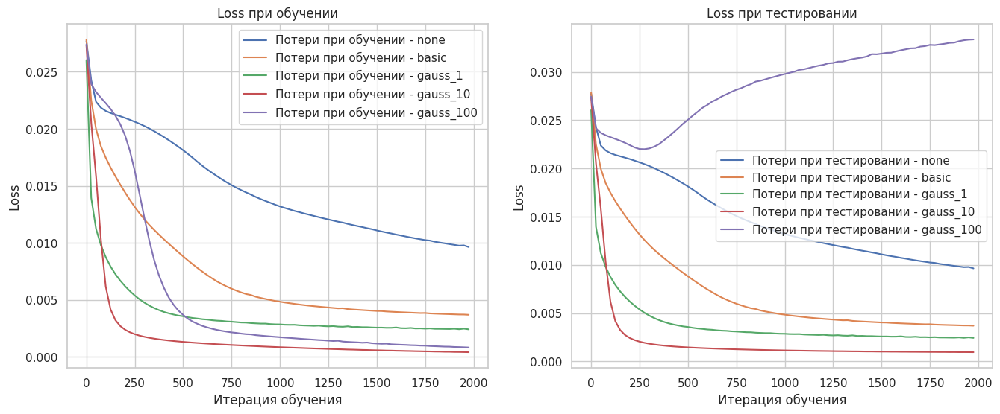

In [20]:
plt.figure(figsize=(24, 4))
N = len(outputs)
for i, k in enumerate(outputs):
    plt.subplot(1, N+1, i+1)
    plt.axis('off')
    plt.imshow(outputs[k]['pred_imgs'][-1], aspect='auto')
    plt.title(k)
plt.subplot(1, N+1, N+1)
plt.imshow(img, aspect='auto') 
plt.title('Оригинальное изображение')
plt.axis('off')
plt.show()

# Кривые PSNR для обучения и тестирования
plt.figure(figsize=(16, 6))

plt.subplot(121)
for i, k in enumerate(outputs):
    plt.plot(outputs[k]['xs'], outputs[k]['train_psnrs'], label=f'Обучение PSNR - {k}')
plt.title('Обучение PSNR')
plt.ylabel('PSNR')
plt.xlabel('Итерация обучения')
plt.legend()

plt.subplot(122)
for i, k in enumerate(outputs):
    plt.plot(outputs[k]['xs'], outputs[k]['test_psnrs'], label=f'Тест PSNR - {k}')
plt.title('Тест PSNR')
plt.ylabel('PSNR')
plt.xlabel('Итерация обучения')
plt.legend()

plt.show()

# Кривые потерь для обучения и тестирования
plt.figure(figsize=(16, 6))

plt.subplot(121)
for i, k in enumerate(outputs):
    plt.plot(outputs[k]['xs'], outputs[k]['train_losses'], label=f'Потери при обучении - {k}')
plt.title('Loss при обучении')
plt.ylabel('Loss')
plt.xlabel('Итерация обучения')
plt.legend()

plt.subplot(122)
for i, k in enumerate(outputs):
    plt.plot(outputs[k]['xs'], outputs[k]['test_losses'], label=f'Потери при тестировании - {k}')
plt.title('Loss при тестировании')
plt.ylabel('Loss')
plt.xlabel('Итерация обучения')
plt.legend()

plt.show()


`basic`: Обозначает использование базовой сети без какого-либо Фурье-признакового преобразования. Это обеспечивает контрольный вариант для сравнения с другими подходами, позволяющий оценить влияние введения Фурье-признаков.

`gauss_1`, `gauss_10`, `gauss_100`: Эти обозначения относятся к сетям, которые используют гауссовские Фурье-признаки с различными масштабами. Число после gauss_ указывает на масштаб коэффициентов в матрице $\mathbf{B}$, которая используется в Фурье-признаковом преобразовании. Большее число означает более высокий масштаб коэффициентов, что позволяет модели лучше адаптироваться к высокочастотным особенностям данных.

**Анализ работы модели на основе предоставленных графиков позволяет сделать следующие выводы:**

1. **Эффективность различных преобразований Фурье:**
   - **PSNR (Peak Signal-to-Noise Ratio)**: Графики PSNR показывают, что использование Фурье-признаков с различными масштабами (`gauss_1.0`, `gauss_10.0`, `gauss_100.0`) приводит к значительному улучшению качества восстановления изображений по сравнению с базовым вариантом (`none`, `basic`). С ростом масштаба Фурье-признаков увеличивается качество предсказания, что видно из повышения PSNR на тренировочных и тестовых данных.
   
2. **Зависимость PSNR от количества итераций обучения:**
   - С увеличением количества итераций PSNR растёт, что указывает на то, что модель продолжает извлекать полезные признаки из данных и улучшать качество восстановления изображений.

3. **Потери в процессе обучения:**
   - **Обучение (Train Loss)**: На графиках видно, что потери на тренировочных данных быстро уменьшаются, что свидетельствует о быстром обучении модели. Модели с гауссовскими признаками демонстрируют  быструю и эффективную сходимость.
   
   - **Тестирование (Test Loss)**: На начальных этапах обучения потери на тестовом наборе данных уменьшаются, однако после определённого момента для некоторых конфигураций начинает наблюдаться рост потерь, что может свидетельствовать о начале переобучения, особенно это заметно для модели с масштабом `gauss_100.0`.

4. **Визуальная оценка качества восстановления изображений:**
   - Восстановленное изображение с использованием гауссовских Фурье-признаков (с коэф. = 10) показывает лучшую чёткость и детализацию по сравнению с остальными моделями, что подтверждается визуальным сравнением и соответствует количественным показателям PSNR.

В целом, анализ показывает, что использование Фурье-признаков с гауссовским распределением в различных масштабах значительно улучшает способность модели к восстановлению деталей изображения и уменьшает ошибку. 

## Сравнение результатов работы моделей

**Анализ качества изображений**\
Восстановленные изображения, полученные с помощью Фурье-признаковой сети, показывают значительное улучшение в четкости и детализации по сравнению с теми, что были восстановлены с использованием PCA. Это можно наблюдать на примере изображений, где даже при высоком уровне сжатия Фурье-признаки сохраняют больше деталей и цветовую точность. Модель с Фурье-признаками способна более точно обрабатывать высокочастотные компоненты изображения, что критически важно для визуального качества.

**Степень сжатия**\
С точки зрения степени сжатия, PCA показывает более высокие значения Compression Ratio на начальных этапах количества компонент, что указывает на более эффективное уменьшение размерности данных при сохранении основных черт изображения. Однако, как видно из графиков, с увеличением количества компонент, качество изображений, восстановленных с помощью PCA, начинает уступать качеству изображений, восстановленных сетью на основе Фурье-признаков.

**Качество сжатия**\
В контексте метрик качества сжатия, таких как PSNR и MSE, модель с Фурье-признаками демонстрирует лучшие результаты. PSNR для Фурье-модели значительно выше на протяжении всех этапов обучения, что свидетельствует о меньшей потере информации при восстановлении. Снижение MSE также подтверждает, что восстановленные изображения ближе к оригиналу.

**Применение**\
**PCA** остается предпочтительным выбором в условиях необходимости экстремального сжатия данных, где не требуется высокая точность восстановления изображения. Это может быть актуально для предварительной обработки больших наборов данных, где скорость и размер данных имеют решающее значение, например, для аналитических задач в больших базах данных.

**Фурье-признаковая сеть** лучше подходит для приложений, требующих высокой точности восстановления изображений, таких как медицинская визуализация или задачи компьютерного зрения, где качество и детализация изображения имеют первостепенное значение.


Для удобства еще раз выведем востановленные изображения:

**PCA:**

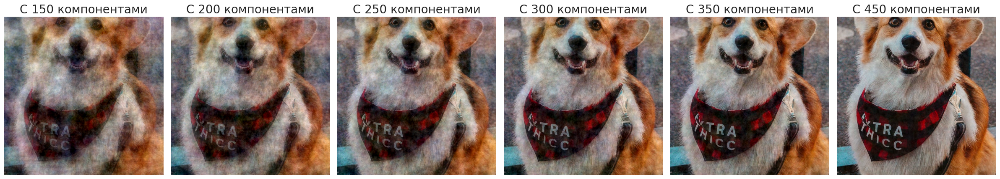

In [21]:
fig, axes = plt.subplots(1, 6, figsize=(24, 12))
images_to_display = images[2:]
for ax, (title, img) in zip(axes.flatten(), images_to_display):
    ax.imshow((np.clip(img, 0, 1) * 255).astype(np.uint8)) 
    ax.set_title(title, fontsize=20)
    ax.axis('off')

plt.tight_layout()
plt.show()


**Fourier Feature Network:**

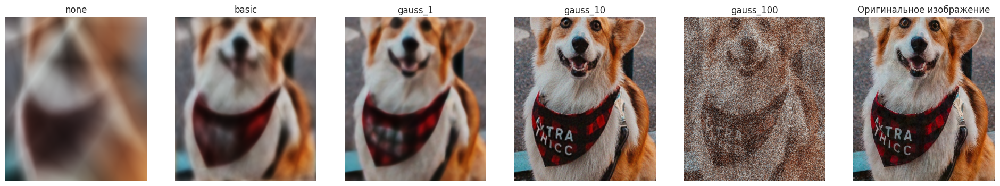

In [22]:
plt.figure(figsize=(24, 4))
N = len(outputs)
for i, k in enumerate(outputs):
    plt.subplot(1, N+1, i+1)
    plt.axis('off')
    plt.imshow(outputs[k]['pred_imgs'][-1], aspect='auto')
    plt.title(k)
plt.subplot(1, N+1, N+1)
plt.imshow(img, aspect='auto') 
plt.title('Оригинальное изображение')
plt.axis('off')
plt.show()

## Заключение



В рамках данной курсовой работы были рассмотрены и сопоставлены два метода сжатия изображений: традиционный метод главных компонент (PCA) и более современный подход на основе многослойных перцептронов (MLP) с Фурье-признаками. Целью исследования было определение их эффективности в контексте сжатия изображений для решения бизнес-задач, связанных с оптимизацией хранения, обработки и передачи визуальных данных.

#### Ключевые выводы:
1. **Метод PCA** показал себя как надежный инструмент для быстрого и эффективного сжатия изображений, особенно полезный в условиях необходимости существенного снижения объема данных. Он подходит для сценариев, где основной приоритет — сокращение размера данных при приемлемых потерях качества, например, в аналитических приложениях, где скорость обработки данных является критичной.

2. **Фурье-признаковые сети** продемонстрировали высокую эффективность в сохранении качества и детализации изображений, даже при значительной степени сжатия. Этот метод идеально подходит для приложений, требующих высокого качества визуализации, таких как медицинская диагностика, цифровое искусство и продвинутые системы визуальной аналитики.

3. **Сравнение методов** выявило, что нет универсального решения для всех сценариев сжатия изображений. Выбор метода зависит от конкретных требований к задаче, включая требуемое качество изображения, скорость обработки и доступные вычислительные ресурсы.

#### Возможности для бизнес-применения:
- **Для массовой обработки данных**, где важны скорость и масштабируемость, PCA остается предпочтительным выбором.
- **В сферах с высокими требованиями к качеству изображений**, таких как здравоохранение и техническое зрение, рекомендуется использовать методы на основе Фурье-признаков.

### Итоги
Исследование показало, что интеграция глубокого обучения в процессы сжатия данных открывает новые перспективы для улучшения технологий обработки изображений. Применение многослойных перцептронов с Фурье-признаками может существенно повысить эффективность обработки визуальных данных, улучшая качество восстановленных изображений и расширяя возможности их применения в различных отраслях. Однако, как и любая технология, она требует дальнейших исследований и оптимизации для адаптации к конкретным задачам и условиям эксплуатации.

## Список литературы
1. Краснопольский, В.М., Шевченко, В.И., & Хацкевич, В.А. (2019). Искусственные нейронные сети: архитектура, применение, программные средства. Москва: Техносфера.
2. Смирнов, Е.А. (2020). Методы сжатия данных на основе нейронных сетей
3. Николенко, С.И., Кадурин, А., & Архангельская, Е. (2018). Глубокое обучение. Погружение в мир нейронных сетей
4. Goodfellow, I., Bengio, Y., & Courville, A. (2016). Deep Learning. MIT Press. 
5. C. Dupont, "Learning algorithms for compression and evaluation of information from large data sets," Soft Computing, 2008.
6. E. Agustsson and L. Theis, "An Introduction to Neural Data Compression," arXiv preprint arXiv:2202.06533, 2022.
7. LeCun, Y., Bengio, Y., & Hinton, G. (2015). Deep learning. Nature, 521(7553), 436-444.
8. Toderici, G., O'Malley, S. M., Hwang, S. J., Vincent, D., Minnen, D (2017). Variable rate image -compression with recurrent neural network
9. Ballé, J., Laparra, V., & Simoncelli, E. P. (2017). End-to-end optimized image compression. ICLR.
10. Theis, L., Shi, W., Cunningham, A., & Huszár, F. (2017). Lossy Image Compression with Compressive Autoencoders. ICLR.
11. Kingma, D. P., & Ba, J. (2014). Adam: A Method for Stochastic Optimization. ICLR.
12. "PyTorch Documentation." Accessed May 13, 2024. 